In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (6,4)
plt.rcParams["font.size"] = 10
np.random.seed(42)


In [2]:
df = pd.read_csv("test_pareto.csv")
df


,iterations,cfg,sd_seed,guidance_rescale,f1_alg,f2,fitness_yolo
0,5.069531,5.080732,221.539381,0.951629,-0.949425,5.0,0.949425
1,3.739418,5.011759,221.539381,0.772906,-0.919047,3.0,0.919047
2,2.285752,5.082268,434.160339,0.914161,-0.543060,2.0,0.543060


In [3]:
required_cols = ["run_id", "f1_alg", "f2"]
missing = set(required_cols) - set(df.columns)

if missing:
    raise ValueError(f"Faltan columnas obligatorias: {missing}")

df = df.dropna().reset_index(drop=True)

df = df.drop_duplicates()


ValueError: Faltan columnas obligatorias: {'run_id'}

In [4]:
df[["f1_alg", "f2"]].describe()

,f1_alg,f2
count,3.000000,3.000000
mean,-0.803844,3.333333
std,0.226356,1.527525
min,-0.949425,2.000000
25%,-0.934236,2.500000
50%,-0.919047,3.000000
75%,-0.731054,4.000000
max,-0.543060,5.000000


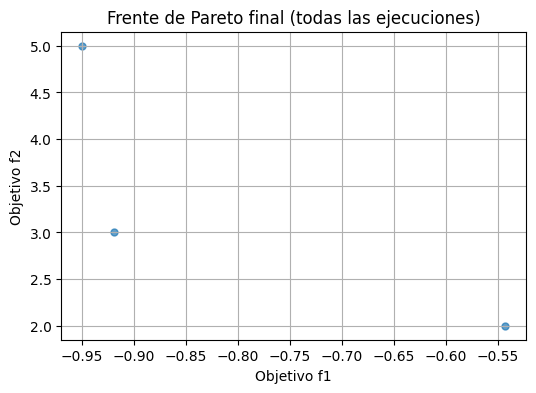

In [5]:
plt.scatter(df["f1_alg"], df["f2"], s=25, alpha=0.7)
plt.xlabel("Objetivo f1")
plt.ylabel("Objetivo f2")
plt.title("Frente de Pareto final (todas las ejecuciones)")
plt.grid(True)
plt.show()


In [6]:
import matplotlib.pyplot as plt

# Asegura que run_id exista
assert "run_id" in df.columns, "No existe la columna run_id en el CSV"

codes, uniques = pd.factorize(df["run_id"])

plt.figure(figsize=(7,4))
sc = plt.scatter(df["f1_alg"], df["f1_alg"], c=codes, s=25, alpha=0.8)
plt.xlabel("Objetivo f1")
plt.ylabel("Objetivo f2")
plt.title("Frente de Pareto final (coloreado por ejecución)")
plt.grid(True)

cbar = plt.colorbar(sc, ticks=range(len(uniques)))
cbar.ax.set_yticklabels([str(u) for u in uniques])

plt.show()


AssertionError: No existe la columna run_id en el CSV

In [7]:
ideal = np.array([df["f1_alg"].min(), df["f2"].min()])

F = df[["f1_alg", "f2"]].values
dist = np.linalg.norm(F - ideal, axis=1)

best_idx = np.argmin(dist)
best_solution = df.loc[best_idx]
best_solution


experiment_id       NSGA2_sbx_polynomial_run10
run_id                                      10
seed                                     78205
timestamp           2026-01-19T07:34:59.448136
idx_in_final_pop                             4
nd_order                                     4
rank                                         0
is_nd                                     True
iterations                                   3
cfg                                     2.9346
sd_seed                                   8515
guidance_rescale                      0.870771
f1_alg                               -0.916871
f2                                         3.0
fitness_yolo                          0.916871
Name: 31, dtype: object

In [8]:
PROMPT = "golden retriever dog, photograph, digital, color, blended visuals"
NEG_PROMPT = "illustration, painting, drawing, art"
best_iterations = int(best_solution["iterations"])
best_cfg_scale = float(best_solution["cfg"])
best_seed = int(best_solution["sd_seed"])
best_rescale = float(best_solution["guidance_rescale"])


In [9]:
prompt_log = (
    f"{PROMPT}\n"
    f"[NSGA-II best] steps={best_iterations}, cfg={best_cfg_scale:.3f}, "
    f"seed={best_seed}, rescale={best_rescale:.3f}"
)
print(prompt_log)


golden retriever dog, photograph, digital, color, blended visuals
[NSGA-II best] steps=3, cfg=2.935, seed=8515, rescale=0.871


In [11]:
!nvidia-smi


Tue Feb  3 18:17:20 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.195.03             Driver Version: 570.195.03     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Quadro RTX 8000                Off |   00000000:37:00.0 Off |                  Off |
| 82%   87C    P0            248W /  260W |   46553MiB /  49152MiB |    100%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
from problema import StableDiffusionProblem
from utils import generar_imagen,analizar_imagen, analizar_imagen_memoria
import os
import datetime
import numpy as np
import torch
from pymoo.core.problem import Problem
from diffusers import StableDiffusionPipeline
from ultralytics import YOLO
from utils import generar_imagen, analizar_imagen, guardar_zip_contenido, analizar_imagen_memoria
from operadores import get_crossover, get_mutation
# Cargar modelos (una sola vez)
pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1")
pipe = pipe.to("cuda" if torch.cuda.is_available() else "cpu")
model = YOLO("yolov8n.pt")

/root/micromamba/envs/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-02-04 06:09:56.161544: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-04 06:09:56.260276: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-04 06:09:58.481519: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slig

In [11]:
best_image = generar_imagen(
    pipe=pipe,
    prompt=PROMPT,
    negative_prompt=NEG_PROMPT,
    steps=best_iterations,
    cfg=best_cfg_scale,
    seed=best_seed,
    rescale=best_rescale
)


100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


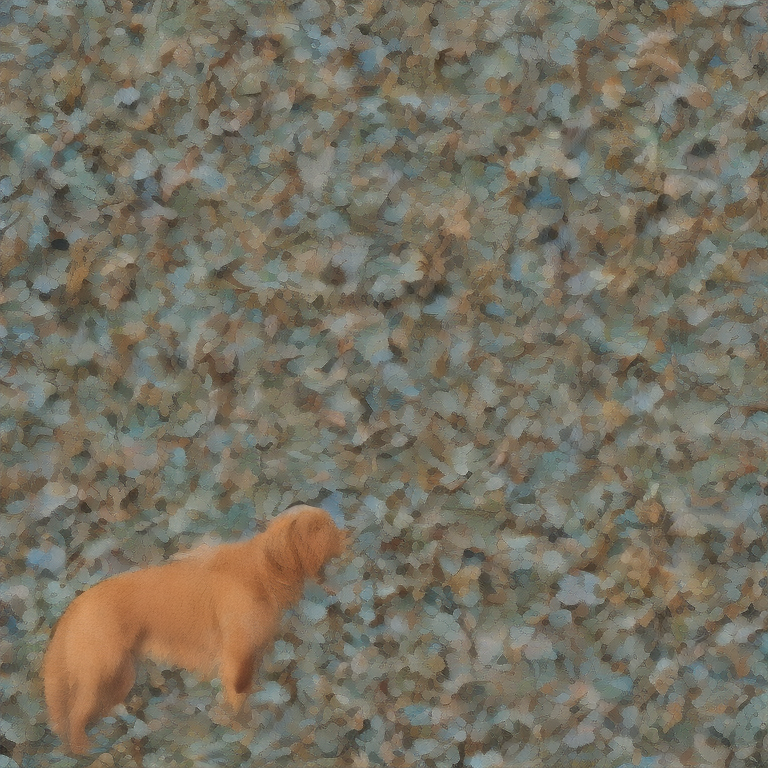

In [12]:
best_image

100%|██████████| 2/2 [00:01<00:00,  1.76it/s]



0: 640x640 1 person, 11.2ms
Speed: 6.4ms preprocess, 11.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 5/5 [00:02<00:00,  2.42it/s]



0: 640x640 1 bear, 10.7ms
Speed: 4.5ms preprocess, 10.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.40it/s]



0: 640x640 1 person, 11.9ms
Speed: 4.5ms preprocess, 11.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.39it/s]



0: 640x640 1 person, 10.7ms
Speed: 4.3ms preprocess, 10.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 5/5 [00:02<00:00,  2.37it/s]



0: 640x640 1 bear, 8.6ms
Speed: 4.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 5/5 [00:02<00:00,  2.35it/s]



0: 640x640 1 bear, 9.5ms
Speed: 4.3ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.35it/s]



0: 640x640 1 person, 9.4ms
Speed: 4.5ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.34it/s]



0: 640x640 1 bear, 8.9ms
Speed: 4.7ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.34it/s]



0: 640x640 1 person, 8.6ms
Speed: 4.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.34it/s]



0: 640x640 1 person, 9.6ms
Speed: 4.3ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.33it/s]



0: 640x640 1 person, 8.7ms
Speed: 4.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.32it/s]



0: 640x640 1 person, 8.9ms
Speed: 4.3ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 5/5 [00:02<00:00,  2.30it/s]



0: 640x640 1 bear, 9.2ms
Speed: 4.3ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 2/2 [00:00<00:00,  2.31it/s]



0: 640x640 1 person, 8.6ms
Speed: 4.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.30it/s]



0: 640x640 1 bear, 8.8ms
Speed: 4.4ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 5/5 [00:02<00:00,  2.28it/s]



0: 640x640 1 bear, 8.5ms
Speed: 4.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.28it/s]



0: 640x640 1 bear, 9.3ms
Speed: 4.3ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.28it/s]



0: 640x640 1 bear, 8.6ms
Speed: 4.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.27it/s]



0: 640x640 1 bear, 8.7ms
Speed: 4.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 3/3 [00:01<00:00,  2.27it/s]



0: 640x640 1 bear, 8.8ms
Speed: 4.4ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


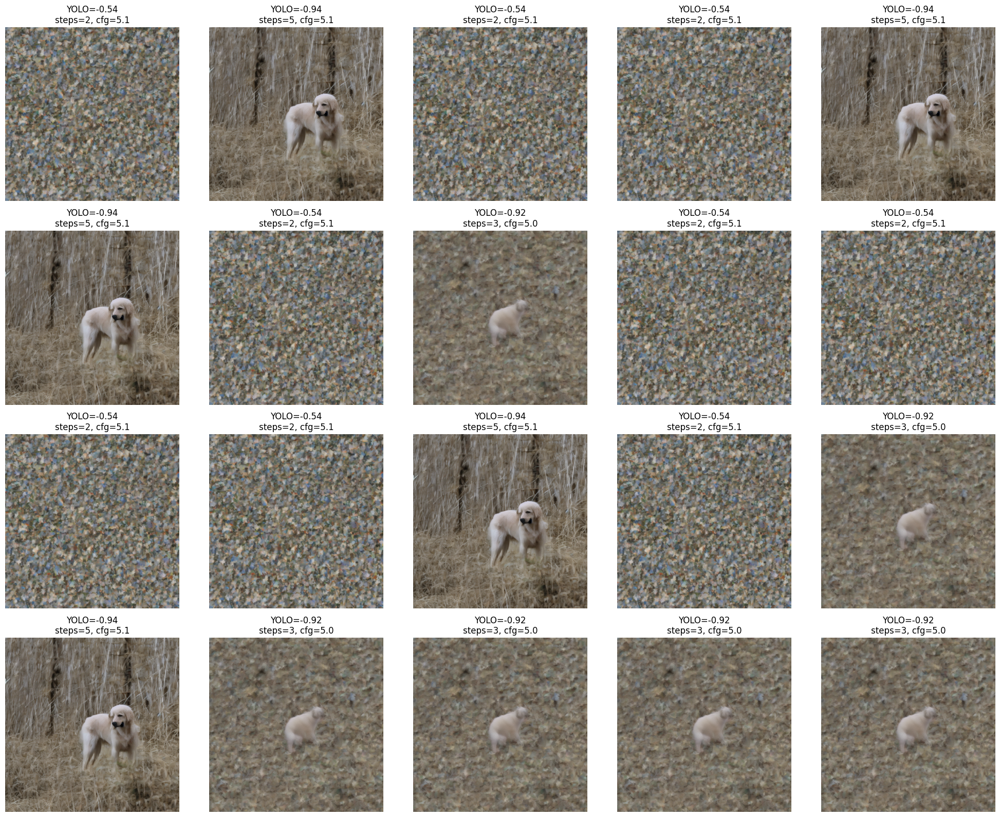

[(-0.5431532263755798,
  2,
  5.082267825375766,
  434,
  0.9141610274705076,
  'TFG/pareto_samples_20/pareto_00_yolo-0.543_steps2_cfg5.08_seed434_rescale0.91.png'),
 (-0.5431532263755798,
  2,
  5.082267825375766,
  434,
  0.9141610274705076,
  'TFG/pareto_samples_20/pareto_02_yolo-0.543_steps2_cfg5.08_seed434_rescale0.91.png'),
 (-0.5431532263755798,
  2,
  5.082267825375766,
  434,
  0.9141610274705076,
  'TFG/pareto_samples_20/pareto_03_yolo-0.543_steps2_cfg5.08_seed434_rescale0.91.png'),
 (-0.5431532263755798,
  2,
  5.082267825375766,
  434,
  0.9141610274705076,
  'TFG/pareto_samples_20/pareto_06_yolo-0.543_steps2_cfg5.08_seed434_rescale0.91.png'),
 (-0.5431532263755798,
  2,
  5.082267825375766,
  434,
  0.9141610274705076,
  'TFG/pareto_samples_20/pareto_08_yolo-0.543_steps2_cfg5.08_seed434_rescale0.91.png')]

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from utils import generar_imagen, analizar_imagen_memoria  # si quieres evaluar YOLO también

# 1) Cargar frente
df = pd.read_csv("test_pareto.csv")

# 2) Sample aleatorio de 20 (si hay menos de 20, usa replace=True)
n = 20
sample_df = df.sample(n=n, replace=(len(df) < n), random_state=None).reset_index(drop=True)

PROMPT = "golden retriever dog, photograph, digital, color, blended visuals"
NEG_PROMPT = "illustration, painting, drawing, art"

# 3) Carpeta salida
out_dir = "TFG/pareto_samples_20"
os.makedirs(out_dir, exist_ok=True)

images = []
scores = []

for i, row in sample_df.iterrows():
    steps   = int(row["iterations"])
    cfg     = float(row["cfg"])
    seed    = int(row["sd_seed"])
    rescale = float(row["guidance_rescale"])

    img = generar_imagen(
        pipe=pipe,
        prompt=PROMPT,
        negative_prompt=NEG_PROMPT,
        steps=steps,
        cfg=cfg,
        seed=seed,
        rescale=rescale
    )

    # (opcional) evaluar YOLO para saber cuál es buena de verdad
    f1, num_objects = analizar_imagen_memoria(model, img)   # f1 = -mean_conf
    yolo_mean_conf = -f1

    # guardar
    fp = os.path.join(out_dir, f"pareto_{i:02d}_yolo{yolo_mean_conf:.3f}_steps{steps}_cfg{cfg:.2f}_seed{seed}_rescale{rescale:.2f}.png")
    img.save(fp)

    images.append(img)
    scores.append((yolo_mean_conf, steps, cfg, seed, rescale, fp))

# 4) Mostrar en grid (4x5)
cols = 5
rows = int(np.ceil(n / cols))
plt.figure(figsize=(4*cols, 4*rows))

for i, img in enumerate(images):
    yolo_mean_conf, steps, cfg, seed, rescale, fp = scores[i]
    ax = plt.subplot(rows, cols, i+1)
    ax.imshow(img)
    ax.set_title(f"YOLO={yolo_mean_conf:.2f}\nsteps={steps}, cfg={cfg:.1f}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# 5) Ranking rápido por YOLO (mejor arriba)
scores_sorted = sorted(scores, key=lambda x: x[0], reverse=True)
scores_sorted[:5]
 

In [5]:
import os
import pandas as pd
from utils import generar_imagen  # SOLO esto

# 1) Cargar CSV
df = pd.read_csv("test_pareto.csv")

# 2) Prompt / Negative prompt
PROMPT = "golden retriever dog, photograph, digital, color, blended visuals"
NEG_PROMPT = "illustration, painting, drawing, art"

# 3) Carpeta de salida
out_dir = "TFG/regeneradas_csv"
os.makedirs(out_dir, exist_ok=True)

# 4) Generar una imagen por fila
for i, row in df.reset_index(drop=True).iterrows():
    steps   = max(1, int(round(float(row["iterations"]))))       # steps int
    cfg     = float(row["cfg"])
    seed    = int(round(float(row["sd_seed"])))                  # seed int
    rescale = float(row["guidance_rescale"])

    img = generar_imagen(
        pipe=pipe,
        prompt=PROMPT,
        negative_prompt=NEG_PROMPT,
        steps=steps,
        cfg=cfg,
        seed=seed,
        rescale=rescale
    )

    fp = os.path.join(
        out_dir,
        f"img_{i:04d}_steps{steps}_cfg{cfg:.2f}_seed{seed}_rescale{rescale:.2f}.png"
    )
    img.save(fp)

print(f"Listo. Guardadas {len(df)} imágenes en: {out_dir}")


100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


Listo. Guardadas 3 imágenes en: TFG/regeneradas_csv


Encontrados 10 CSV

📄 pareto_NSGA2_sbx_polynomial_run01  |  filas: 4


100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


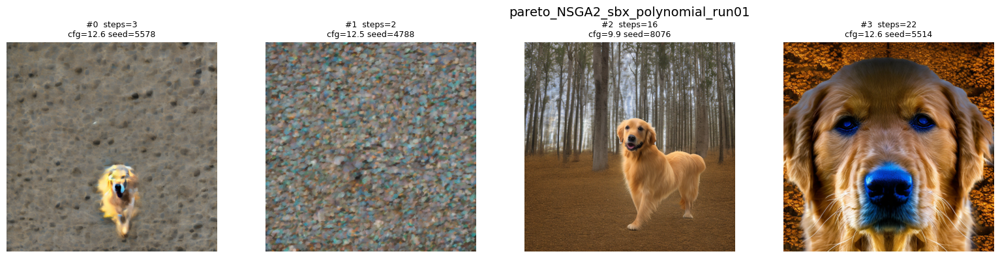


📄 pareto_NSGA2_sbx_polynomial_run02  |  filas: 2


100%|██████████| 9/9 [00:04<00:00,  2.24it/s]


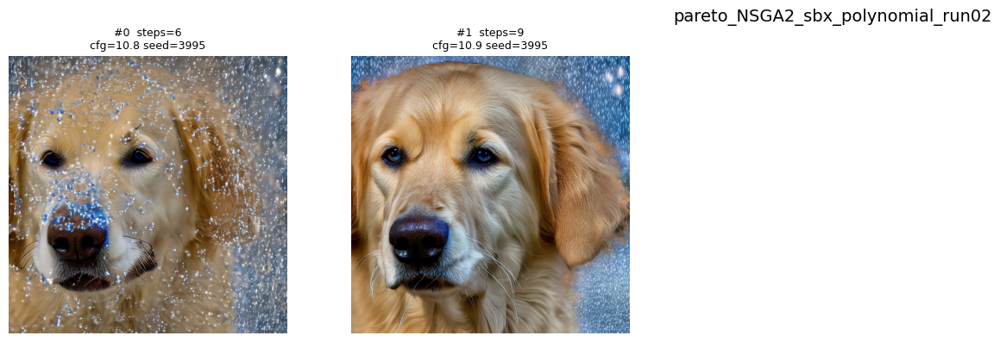


📄 pareto_NSGA2_sbx_polynomial_run03  |  filas: 8


100%|██████████| 4/4 [00:01<00:00,  2.20it/s]


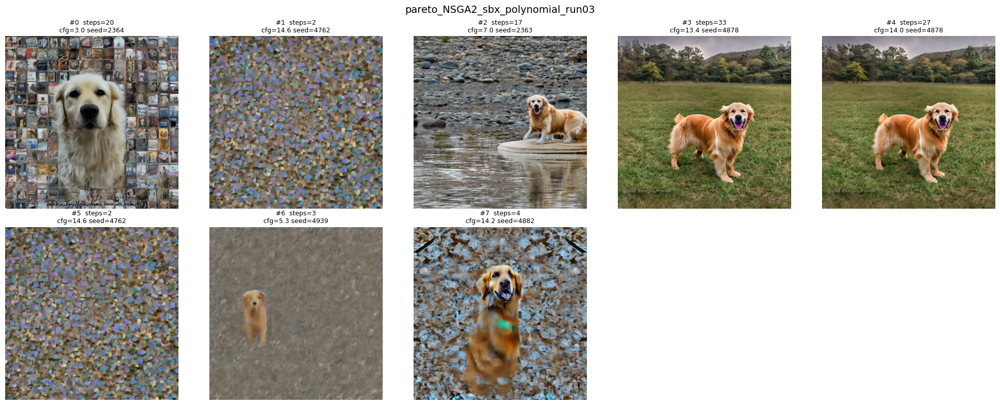


📄 pareto_NSGA2_sbx_polynomial_run04  |  filas: 4


100%|██████████| 4/4 [00:01<00:00,  2.21it/s]


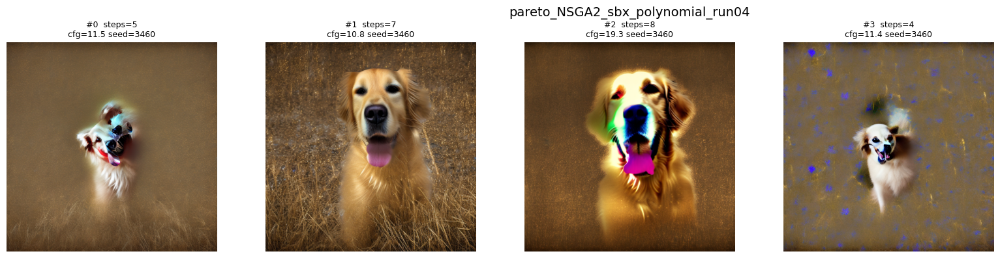


📄 pareto_NSGA2_sbx_polynomial_run05  |  filas: 7


100%|██████████| 13/13 [00:05<00:00,  2.21it/s]


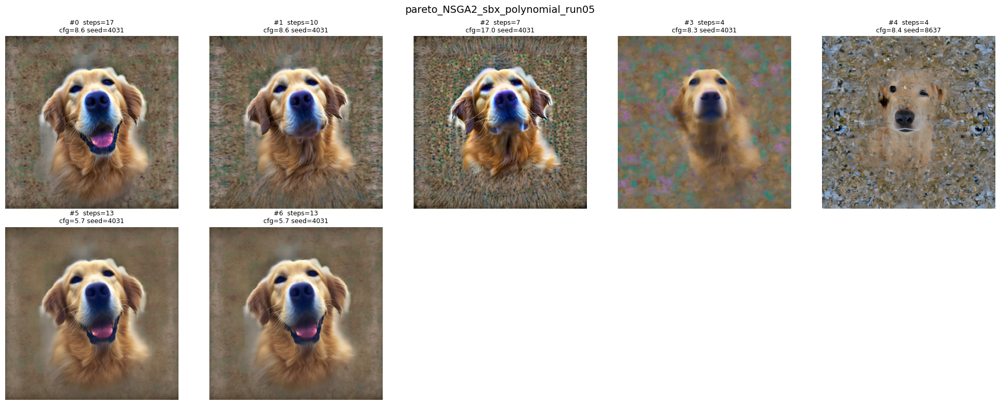


📄 pareto_NSGA2_sbx_polynomial_run06  |  filas: 2


100%|██████████| 2/2 [00:00<00:00,  2.28it/s]


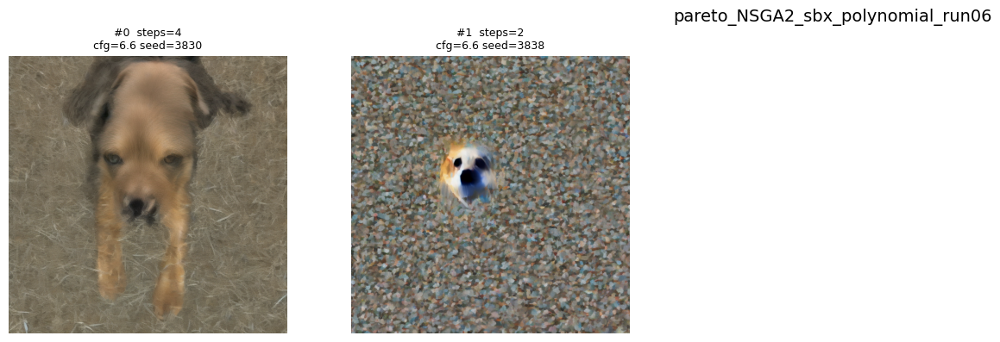


📄 pareto_NSGA2_sbx_polynomial_run07  |  filas: 9


100%|██████████| 12/12 [00:05<00:00,  2.24it/s]


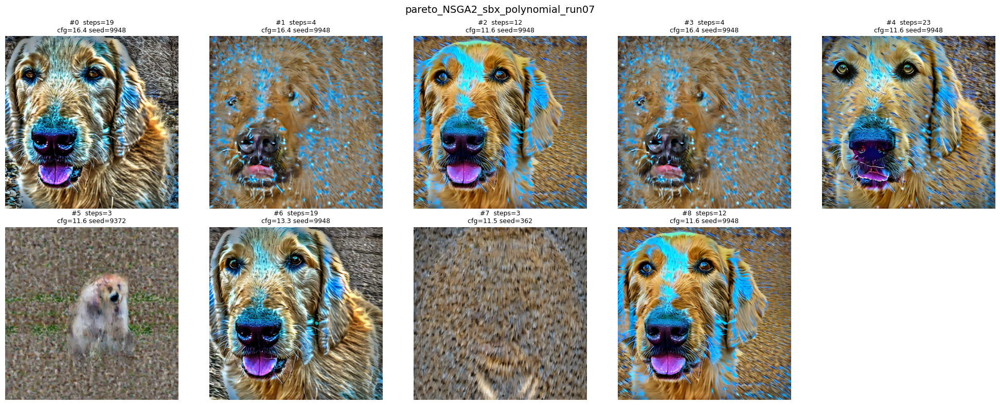


📄 pareto_NSGA2_sbx_polynomial_run08  |  filas: 3


100%|██████████| 2/2 [00:00<00:00,  2.28it/s]


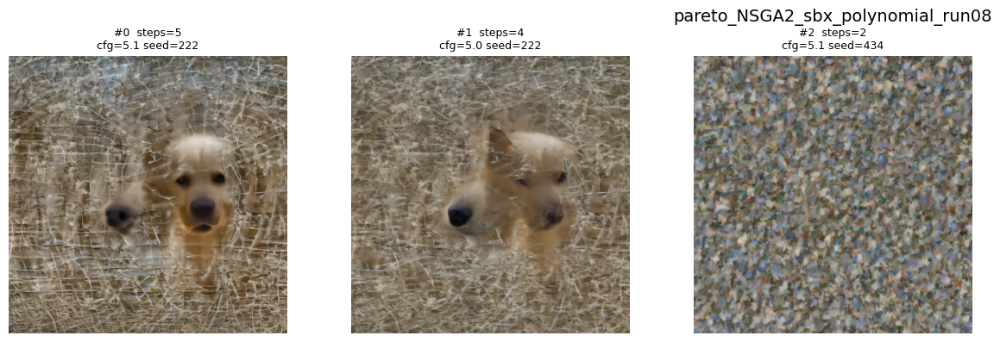


📄 pareto_NSGA2_sbx_polynomial_run09  |  filas: 5


100%|██████████| 3/3 [00:01<00:00,  2.28it/s]


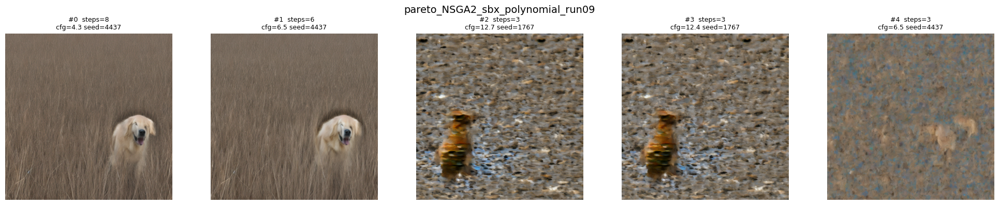


📄 pareto_NSGA2_sbx_polynomial_run10  |  filas: 4


100%|██████████| 4/4 [00:01<00:00,  2.28it/s]


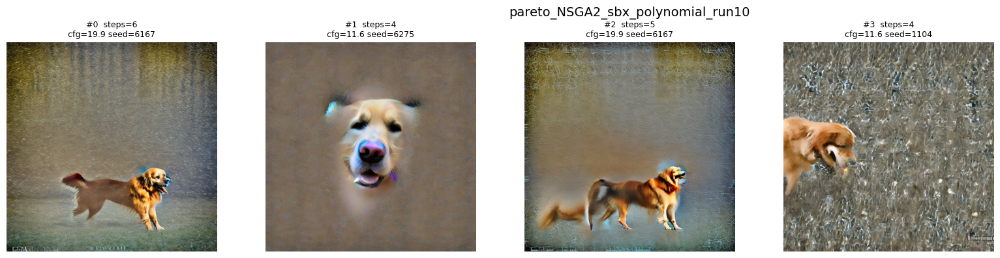


✅ Terminado: imágenes generadas y mostradas en el notebook.


In [7]:
import os
import glob
import math
import pandas as pd
import matplotlib.pyplot as plt
from utils import generar_imagen

CSV_DIR = "TFG/paretos"
OUT_DIR = "TFG/regeneradas_todas"
os.makedirs(OUT_DIR, exist_ok=True)

PROMPT = "golden retriever dog, photograph, digital, color, blended visuals"
NEG_PROMPT = "illustration, painting, drawing, art"

# Ajustes de visualización
COLS = 5                 # columnas del grid
BATCH_SHOW = 20          # cuántas imágenes mostrar por pantalla (página)
SAVE_IMAGES = True       # pon False si NO quieres guardar en disco

csv_files = sorted(glob.glob(os.path.join(CSV_DIR, "*.csv")))
print(f"Encontrados {len(csv_files)} CSV")

for csv_path in csv_files:
    df = pd.read_csv(csv_path)
    csv_name = os.path.splitext(os.path.basename(csv_path))[0]

    print(f"\n==============================")
    print(f"📄 {csv_name}  |  filas: {len(df)}")
    print(f"==============================")

    # carpeta para este CSV
    csv_out_dir = os.path.join(OUT_DIR, csv_name)
    if SAVE_IMAGES:
        os.makedirs(csv_out_dir, exist_ok=True)

    batch_imgs = []
    batch_titles = []
    batch_paths = []

    for row_idx, row in df.reset_index(drop=True).iterrows():
        steps   = max(1, int(round(float(row["iterations"]))))
        cfg     = float(row["cfg"])
        seed    = int(round(float(row["sd_seed"])))
        rescale = float(row["guidance_rescale"])

        img = generar_imagen(
            pipe=pipe,
            prompt=PROMPT,
            negative_prompt=NEG_PROMPT,
            steps=steps,
            cfg=cfg,
            seed=seed,
            rescale=rescale
        )

        # Guardar (opcional)
        if SAVE_IMAGES:
            fp = os.path.join(
                csv_out_dir,
                f"img_{row_idx:04d}_steps{steps}_cfg{cfg:.2f}_seed{seed}_rescale{rescale:.2f}.png"
            )
            img.save(fp)
            batch_paths.append(fp)
        else:
            batch_paths.append("")

        # Guardar para mostrar
        batch_imgs.append(img)
        batch_titles.append(f"#{row_idx}  steps={steps}\ncfg={cfg:.1f} seed={seed}")

        # Cuando juntamos BATCH_SHOW imágenes, las pintamos
        if len(batch_imgs) == BATCH_SHOW:
            rows = math.ceil(len(batch_imgs) / COLS)
            plt.figure(figsize=(4*COLS, 4*rows))

            for i, (im, title) in enumerate(zip(batch_imgs, batch_titles)):
                ax = plt.subplot(rows, COLS, i+1)
                ax.imshow(im)
                ax.set_title(title, fontsize=9)
                ax.axis("off")

            plt.suptitle(csv_name, fontsize=14)
            plt.tight_layout()
            plt.show()

            # limpiar batch para siguiente "página"
            batch_imgs, batch_titles, batch_paths = [], [], []

    # Pintar las que queden (último batch)
    if len(batch_imgs) > 0:
        rows = math.ceil(len(batch_imgs) / COLS)
        plt.figure(figsize=(4*COLS, 4*rows))

        for i, (im, title) in enumerate(zip(batch_imgs, batch_titles)):
            ax = plt.subplot(rows, COLS, i+1)
            ax.imshow(im)
            ax.set_title(title, fontsize=9)
            ax.axis("off")

        plt.suptitle(csv_name, fontsize=14)
        plt.tight_layout()
        plt.show()

print("\n✅ Terminado: imágenes generadas y mostradas en el notebook.")


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Cargar el historial por generación
df = pd.read_csv("history.csv")

# Nos quedamos con los campos relevantes (un punto por generación)
pts = df[["experiment_id", "run_id", "seed", "gen", "f1_min", "f2_min", "hypervolume"]].dropna().copy()

# --- Pareto (asumiendo minimización en ambos objetivos) ---
X = pts[["f1_min", "f2_min"]].to_numpy()

def pareto_mask_minimization(X: np.ndarray) -> np.ndarray:
    """
    True = no dominado (minimización).
    Un punto j domina a i si:
      X[j] <= X[i] en todo y X[j] < X[i] en al menos una dimensión.
    """
    n = X.shape[0]
    is_nd = np.ones(n, dtype=bool)
    for i in range(n):
        if not is_nd[i]:
            continue
        dominates_i = np.all(X <= X[i], axis=1) & np.any(X < X[i], axis=1)
        dominates_i[i] = False
        if np.any(dominates_i):
            is_nd[i] = False
        else:
            dominated_by_i = np.all(X[i] <= X, axis=1) & np.any(X[i] < X, axis=1)
            dominated_by_i[i] = False
            is_nd[dominated_by_i] = False
    return is_nd

mask = pareto_mask_minimization(X)
pareto_gens = pts[mask].copy()

print(f"Total generaciones: {len(pts)} | No dominadas (Pareto): {len(pareto_gens)}")
print(pareto_gens.sort_values(["f1_min", "f2_min"]).head(10))

# --- Plot ---
plt.scatter(pts["f1_min"], pts["f2_min"])
plt.scatter(pareto_gens["f1_min"], pareto_gens["f2_min"])
plt.xlabel("f1_min (minimizar)")
plt.ylabel("f2_min (minimizar)")
plt.title("Pareto (por generación) usando f1_min vs f2_min")
plt.grid(True)
plt.show()
